In [1]:
# Instalo o folium
# !pip install folium

In [2]:
import pandas as pd
import folium
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt

Site aonde os dados foram retirados
https://dadosabertos.poa.br/dataset/acidentes-de-transito-acidentes

In [3]:
df = pd.read_csv('cat_acidentes.csv', sep=";")
df

,data_extracao,predial1,queda_arr,data,feridos,feridos_gr,mortes,morte_post,fatais,auto,...,longitude,latitude,log1,log2,tipo_acid,dia_sem,hora,noite_dia,regiao,consorcio
0,2023-11-01 01:33:25,0.0,0.0,2020-10-17 00:00:00,1,0,0,0,0,3,...,0.000000,0.000000,R MARCOS MOREIRA,R GASTON ENGLERT,ABALROAMENTO,SÁBADO,19:00:00.0000000,NOITE,NORTE,NaN
1,2023-11-01 01:33:25,170.0,0.0,2018-01-01 00:00:00,1,0,0,0,0,1,...,-51.214455,-30.122420,R CASEMIRO DE SOUZA,NaN,ATROPELAMENTO,SEGUNDA-FEIRA,00:30:00.0000000,NOITE,SUL,NaN
2,2023-11-01 01:33:25,2617.0,0.0,2018-01-01 00:00:00,0,0,0,0,0,1,...,-51.203106,-30.073318,AV PROF OSCAR PEREIRA,NaN,COLISÃO,SEGUNDA-FEIRA,07:55:00.0000000,DIA,SUL,NaN
3,2023-11-01 01:33:25,1590.0,0.0,2018-01-01 00:00:00,1,0,0,0,0,1,...,-51.134118,-30.229493,AV BOA VISTA,NaN,CHOQUE,SEGUNDA-FEIRA,20:18:00.0000000,NOITE,SUL,NaN
4,2023-11-01 01:33:25,0.0,0.0,2018-01-01 00:00:00,1,0,0,0,0,1,...,NaN,NaN,AV BOA VISTA,NaN,CHOQUE,SEGUNDA-FEIRA,11:00:00.0000000,DIA,SUL,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73555,2023-11-01 01:33:25,1669.0,0.0,2023-10-26 00:00:00,0,0,0,0,0,2,...,-51.197089,-30.033105,R QUINTINO BOCAIUVA,NaN,ABALROAMENTO,QUINTA-FEIRA,13:45:00.0000000,DIA,LESTE,NaN
73556,2023-11-01 01:33:25,3.0,0.0,2023-10-26 00:00:00,0,0,0,0,0,2,...,-51.204285,-30.037780,R SILVA SO,NaN,ABALROAMENTO,QUINTA-FEIRA,14:00:00.0000000,DIA,LESTE,NaN
73557,2023-11-01 01:33:25,128.0,0.0,2023-10-26 00:00:00,0,0,0,0,0,2,...,-51.176752,-30.047680,R ENG ANTONIO CARLOS TIBIRICA,R CEL AURELIO DO AMARAL,ABALROAMENTO,QUINTA-FEIRA,17:25:00.0000000,DIA,LESTE,NaN
73558,2023-11-01 01:33:25,726.0,0.0,2023-10-26 00:00:00,0,0,0,0,0,2,...,-51.188450,-30.026754,R ANITA GARIBALDI,R ARTUR ROCHA,ABALROAMENTO,QUINTA-FEIRA,09:40:00.0000000,DIA,LESTE,NaN


In [4]:
# Perceba a quantidade linhas ANTES do tratameto NaN
df.shape

(73560, 34)

In [5]:
# Faço o tratamento dos valores NaN
df = df.dropna(subset=['latitude','longitude'], how='any')

In [6]:
# Perceba a quantidade linhas DEPOIS do tratameto NaN
df.shape

(62425, 34)

In [7]:
# Mapa de calor
mapa = folium.Map(location=[-30.1,-51.15], zoom_start=11)
coordenadas = list(zip(df.latitude,df.longitude))
mapa_calor = HeatMap(coordenadas, radius=9, blur=10)
mapa.add_child(mapa_calor)
mapa

In [8]:
# Mapa do tipo Cluster
mapa = folium.Map(location=[-30.1,-51.15], zoom_start=11)
mapa_cluster = MarkerCluster(coordenadas)
mapa.add_child(mapa_cluster)
mapa

In [9]:
# A coluna data esta no tipo "object" e precisa mudar para o tipo "time"
df['data'].info()

<class 'pandas.core.series.Series'>
Index: 62425 entries, 0 to 73559
Series name: data
Non-Null Count  Dtype 
--------------  ----- 
62425 non-null  object
dtypes: object(1)
memory usage: 975.4+ KB


In [10]:
# Exibindo a quatidade de acidentes de cada ano
df['data'] = pd.to_datetime(df['data'])
df_ano = df['data'].dt.year.value_counts()
df_ano

/tmp/ipykernel_5571/1636706950.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['data'] = pd.to_datetime(df['data'])


data
2022    13325
2019    12444
2023    11743
2021    11699
2018    10319
2020     2894
2102        1
Name: count, dtype: int64

O comando anterior de uma mensagem de erro porque a o ano "2102" que alguém digitou errado, por isso precisamos retirar essa ano.

In [11]:
# Estou retirando a linha aonde o ano "2102" foi colocado
df_ano = df_ano.drop(2102)

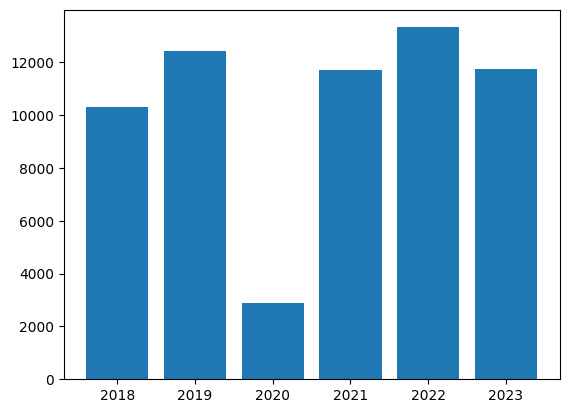

In [12]:
# Exibindo o grafico de barras de como fica a quantidade de acidentes por ano.
plt.bar(df_ano.index, df_ano.values)
plt.show()